In [335]:
import pandas as pd
import numpy as np
from scipy.io import arff

data, meta = arff.loadarff('bone-marrow.arff')

df = pd.DataFrame(data)
df.replace(b"?", np.nan, inplace=True)
df.replace(1000000.0, np.nan, inplace=True)
#source: https://archive.ics.uci.edu/dataset/565/bone+marrow+transplant+children

In [336]:
dataset = df['survival_time']
y = np.zeros(187)
for i,val in enumerate(dataset):
    if val < 366:
        y[i] = 1
df['1_year_survival_status'] = list(y)

In [337]:
int_col = ['Recipientgender', 'Stemcellsource', 'Donorage', 'Donorage35', 'IIIV',
       'Gendermatch', 'DonorABO', 'RecipientABO', 'RecipientRh', 'ABOmatch',
       'CMVstatus', 'DonorCMV', 'RecipientCMV', 'Riskgroup',
       'Txpostrelapse', 'Diseasegroup', 'HLAmatch', 'HLAmismatch', 'Antigen',
       'Alel', 'HLAgrI', 'Recipientage10', 'Recipientageint',
       'Relapse', 'aGvHDIIIIV', 'extcGvHD', 'ANCrecovery', 'PLTrecovery',
       'time_to_aGvHD_III_IV', 'survival_time', 'survival_status', '1_year_survival_status']
float_col = ['Donorage', 'Recipientage', 'CD34kgx10d6', 'CD3dCD34',
       'CD3dkgx10d8', 'Rbodymass', ]
string_col = ['Disease']

for col, t in df.dtypes.items():
    if col in int_col:
        df[col] = df[col].apply(lambda x: int(x) if not pd.isnull(x) else x)
    elif col in float_col:
        df[col] = df[col].apply(lambda x: float(x) if not pd.isnull(x) else x)
    elif col in string_col:
        df[col] = df[col].apply(lambda x: x.decode("utf-8"))


In [338]:
print('# of rows:', df.shape[0])
print('# of columns:', df.shape[1])

# of rows: 187
# of columns: 38


In [339]:
df

,Recipientgender,Stemcellsource,Donorage,Donorage35,IIIV,Gendermatch,DonorABO,RecipientABO,RecipientRh,ABOmatch,CMVstatus,DonorCMV,RecipientCMV,Disease,Riskgroup,Txpostrelapse,Diseasegroup,HLAmatch,HLAmismatch,Antigen,Alel,HLAgrI,Recipientage,Recipientage10,Recipientageint,Relapse,aGvHDIIIIV,extcGvHD,CD34kgx10d6,CD3dCD34,CD3dkgx10d8,Rbodymass,ANCrecovery,PLTrecovery,time_to_aGvHD_III_IV,survival_time,survival_status,1_year_survival_status
0,1,1,22,0,1,0,1,1.0,1.0,0.0,3.0,1.0,1.0,ALL,1,0,1,0,0,-1.0,-1.0,0,9.6,0,1,0,0,1.0,7.200,1.338760,5.38,35.00,19.0,51.0,32.0,999,0,0
1,1,0,23,0,1,0,-1,-1.0,1.0,0.0,0.0,0.0,0.0,ALL,0,0,1,0,0,-1.0,-1.0,0,4.0,0,0,1,1,1.0,4.500,11.078295,0.41,20.60,16.0,37.0,NaN,163,1,1
2,1,0,26,0,1,0,-1,-1.0,1.0,0.0,2.0,0.0,1.0,ALL,0,0,1,0,0,-1.0,-1.0,0,6.6,0,1,1,1,1.0,7.940,19.013230,0.42,23.40,23.0,20.0,NaN,435,1,0
3,0,0,39,1,1,0,1,2.0,1.0,1.0,1.0,1.0,0.0,AML,0,0,1,0,0,-1.0,-1.0,0,18.1,1,2,0,0,NaN,4.250,29.481647,0.14,50.00,23.0,29.0,19.0,53,1,1
4,0,1,33,0,0,0,1,2.0,0.0,1.0,0.0,0.0,1.0,chronic,1,0,1,1,0,1.0,0.0,1,1.3,0,0,0,1,1.0,51.850,3.972255,13.05,9.00,14.0,14.0,NaN,2043,0,0
5,1,0,27,0,0,0,2,0.0,1.0,1.0,NaN,NaN,1.0,chronic,1,1,1,0,0,-1.0,-1.0,0,8.9,0,1,0,1,1.0,3.270,8.412758,0.39,40.00,16.0,70.0,NaN,2800,0,0
6,0,1,34,0,1,0,0,1.0,0.0,1.0,NaN,0.0,NaN,AML,0,0,1,0,0,-1.0,-1.0,0,14.4,1,2,0,0,NaN,17.780,2.406248,7.39,51.00,17.0,29.0,18.0,41,1,1
7,1,0,21,0,1,0,0,1.0,1.0,1.0,1.0,1.0,0.0,nonmalignant,0,0,0,3,1,1.0,2.0,7,18.2,1,2,0,0,NaN,6.410,NaN,NaN,56.00,22.0,58.0,22.0,45,1,1
8,1,1,32,0,0,0,2,0.0,1.0,1.0,2.0,0.0,1.0,nonmalignant,0,0,0,0,0,-1.0,-1.0,0,7.9,0,1,0,1,1.0,23.540,3.772555,6.24,20.50,15.0,14.0,NaN,671,0,0
9,1,1,28,0,1,1,1,0.0,1.0,1.0,2.0,0.0,1.0,nonmalignant,0,0,0,1,0,0.0,1.0,3,4.7,0,0,0,1,1.0,7.690,1.035244,7.43,16.50,16.0,17.0,NaN,676,0,0


In [362]:
X = df.drop(labels=['survival_status', 'survival_time','1_year_survival_status'], axis=1)
y = df['1_year_survival_status']

In [341]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)


In [342]:
print('data dimensions:',df.shape)
perc_missing_per_ftr = df.isnull().sum(axis=0)/df.shape[0]
print('fraction of missing values in features:')
print(perc_missing_per_ftr[perc_missing_per_ftr > 0])
print('data types of the features with missing values:')
print(df[perc_missing_per_ftr[perc_missing_per_ftr > 0].index].dtypes)
frac_missing = sum(df.isnull().sum(axis=1)!=0)/df.shape[0]
print('fraction of points with missing values:',frac_missing)

data dimensions: (187, 38)
fraction of missing values in features:
RecipientABO            0.005348
RecipientRh             0.010695
ABOmatch                0.005348
CMVstatus               0.085561
DonorCMV                0.010695
RecipientCMV            0.074866
Antigen                 0.005348
Alel                    0.005348
extcGvHD                0.165775
CD3dCD34                0.026738
CD3dkgx10d8             0.026738
Rbodymass               0.010695
ANCrecovery             0.026738
PLTrecovery             0.090909
time_to_aGvHD_III_IV    0.775401
dtype: float64
data types of the features with missing values:
RecipientABO            float64
RecipientRh             float64
ABOmatch                float64
CMVstatus               float64
DonorCMV                float64
RecipientCMV            float64
Antigen                 float64
Alel                    float64
extcGvHD                float64
CD3dCD34                float64
CD3dkgx10d8             float64
Rbodymass              

print(df.shape)
df = df.dropna(axis=0)
print(df_r.shape)

In [343]:
print(y.value_counts())

1_year_survival_status
0    121
1     66
Name: count, dtype: int64


In [344]:
pd.set_option('display.max_rows', 100)
dataset = df[y == 0]['survival_time'].value_counts()
#dataset.sort_index()

In [363]:
X.columns

Index(['Recipientgender', 'Stemcellsource', 'Donorage', 'Donorage35', 'IIIV',
       'Gendermatch', 'DonorABO', 'RecipientABO', 'RecipientRh', 'ABOmatch',
       'CMVstatus', 'DonorCMV', 'RecipientCMV', 'Disease', 'Riskgroup',
       'Txpostrelapse', 'Diseasegroup', 'HLAmatch', 'HLAmismatch', 'Antigen',
       'Alel', 'HLAgrI', 'Recipientage', 'Recipientage10', 'Recipientageint',
       'Relapse', 'aGvHDIIIIV', 'extcGvHD', 'CD34kgx10d6', 'CD3dCD34',
       'CD3dkgx10d8', 'Rbodymass', 'ANCrecovery', 'PLTrecovery',
       'time_to_aGvHD_III_IV'],
      dtype='object')

1_year_survival_status   0   1
Stemcellsource                
0                       22  20
1                       99  46
1_year_survival_status         0         1
Stemcellsource                            
0                       0.523810  0.476190
1                       0.682759  0.317241


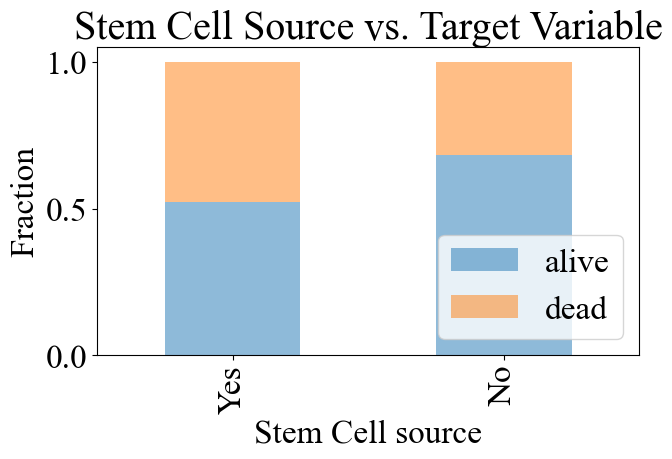

In [429]:
import numpy as np
from matplotlib import pylab as plt

y1 = ['CMVstatus', 'HLAmatch', 'Antigen', 'Alel', 'HLAgrI', 'Recipientageint', 
      'Recipientgender', 'Stemcellsource', 'Donorage35', 'IIIV',
       'Gendermatch', 'DonorABO', 'RecipientABO', 'RecipientRh', 'ABOmatch',
       'DonorCMV', 'RecipientCMV', 'Disease', 'Riskgroup',
       'Txpostrelapse', 'Diseasegroup', 'HLAmismatch', 'Recipientage10',
       'Relapse', 'aGvHDIIIIV', 'extcGvHD']

count_matrix = df.groupby(['Stemcellsource','1_year_survival_status']).size().unstack()
print(count_matrix)

count_matrix_norm = count_matrix.div(count_matrix.sum(axis=1),axis=0)
print(count_matrix_norm)

count_matrix_norm.plot(kind='bar', stacked=True,figsize=(7,4), alpha = 0.5)
plt.ylabel('Fraction')
plt.xlabel('Stem Cell source')
plt.xticks([0,1], ['Yes', 'No'])
plt.legend(['alive', 'dead'], loc=4)
plt.title('Stem Cell Source vs. Target Variable')
plt.show()



from matplotlib import pylab as plt

dataset = [df[y == 0]['PLTrecovery'].values,           
           df[y == 1 ]['PLTrecovery'].values]
plt.figure(figsize=(5,3))
plt.violinplot(dataset = dataset)
plt.xticks([1,2],['0', '1'])
plt.ylabel('PLTrecovery')
plt.show()
make sure there are three visualization types



1_year_survival_status   0   1
RecipientCMV                  
0.0                     49  24
1.0                     66  34
1_year_survival_status         0         1
RecipientCMV                              
0.0                     0.671233  0.328767
1.0                     0.660000  0.340000


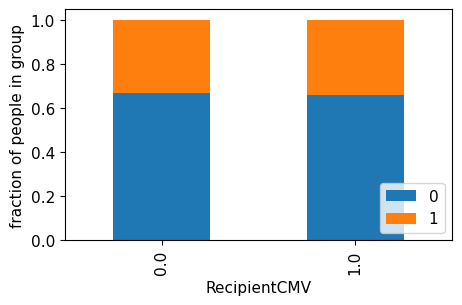

In [347]:
import numpy as np
from matplotlib import pylab as plt

count_matrix = df.groupby(['RecipientCMV','1_year_survival_status']).size().unstack()
print(count_matrix)

count_matrix_norm = count_matrix.div(count_matrix.sum(axis=1),axis=0)
print(count_matrix_norm)

count_matrix_norm.plot(kind='bar', stacked=True,figsize=(5,3))
plt.ylabel('fraction of people in group')
plt.legend(loc=4)
plt.show()

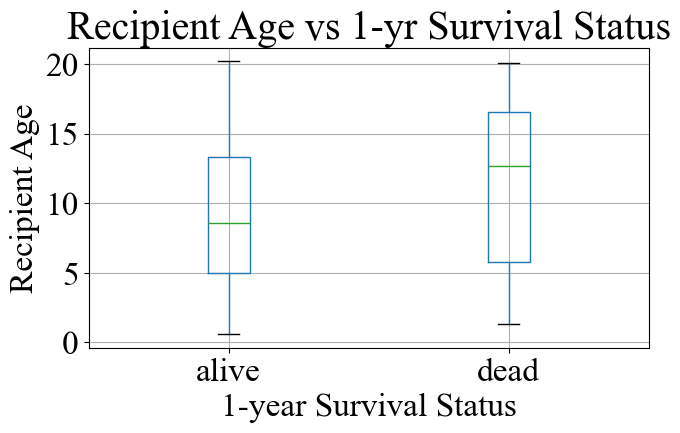

In [418]:
y2 = ['Donorage','Recipientage', 'CD34kgx10d6', 'CD3dCD34', 'CD3dkgx10d8', 
      'Rbodymass', 'ANCrecovery', 'PLTrecovery',
       'time_to_aGvHD_III_IV', 'survival_time']

df[['Recipientage','1_year_survival_status']].boxplot(by='1_year_survival_status', figsize=(7,4))
plt.ylabel('Recipient Age')
plt.xlabel('1-year Survival Status')
plt.yticks([0,5,10,15,20])
plt.xticks([1,2],['alive', 'dead'])
plt.title("Recipient Age vs 1-yr Survival Status")
plt.suptitle('')
plt.show()

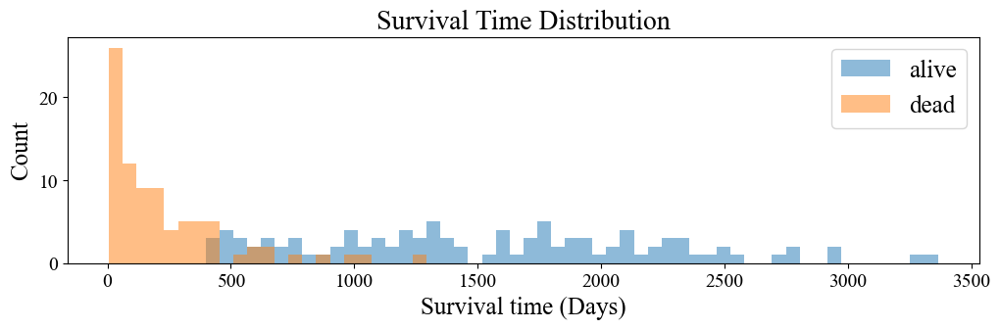

In [405]:
bin_range = (df['survival_time'].min(),df['survival_time'].max())
plt.rcParams['font.sans-serif'] = 'Times New Roman'
plt.figure(figsize=(12,3))

for c in [0,1]:
    plt.hist(df[df['survival_status']==c]['survival_time'],alpha=0.5,label=c,range=bin_range,bins=60)
plt.legend(['alive', 'dead'], fontsize=18)
plt.ylabel('Count', fontsize=18)
plt.xlabel('Survival time (Days)', fontsize=18)
plt.title('Survival Time Distribution',fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

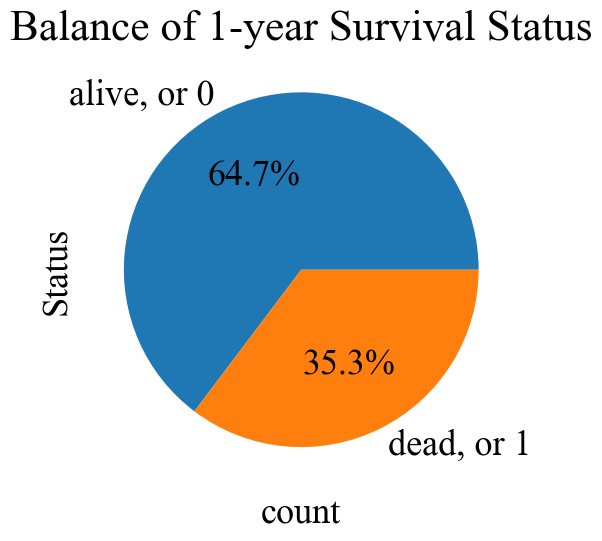

In [400]:
plt.figure(figsize=(10,6))

plt.rcParams['font.size'] =26
plt.rcParams['font.sans-serif'] = 'Times New Roman'
y.value_counts().reindex([0,1]).plot.pie(color = ['cornflowerblue', 'bisque'], labels = ['alive, or 0', 'dead, or 1'], autopct='%1.1f%%')
plt.xlabel('count')
plt.ylabel('Status')
plt.title('Balance of 1-year Survival Status')
plt.tight_layout()
#plt.yticks([0,1], ['alive', 'dead'])
plt.show()

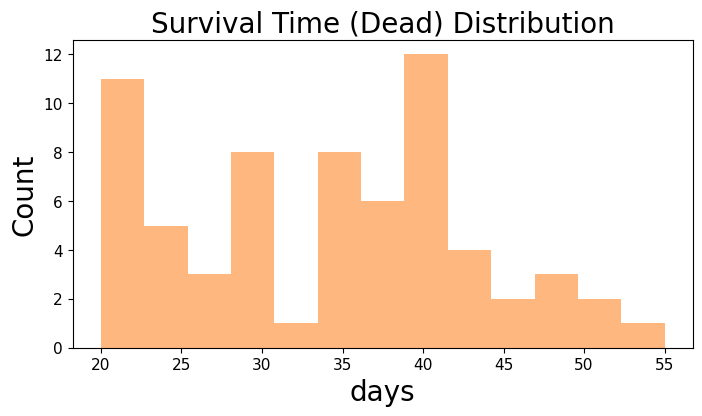

In [351]:
plt.figure(figsize=(8,4))
dataset = df[y == 1]['Donorage'].values

plt.hist(dataset, bins = int(np.sqrt(df.shape[0])), color="#ffb780")
plt.xlabel('days', fontsize=20)
plt.ylabel('Count', fontsize=20)
plt.title('Survival Time (Dead) Distribution', fontsize=20)
plt.show()

In [352]:
df['aGvHDIIIIV'].value_counts()

aGvHDIIIIV
1    147
0     40
Name: count, dtype: int64

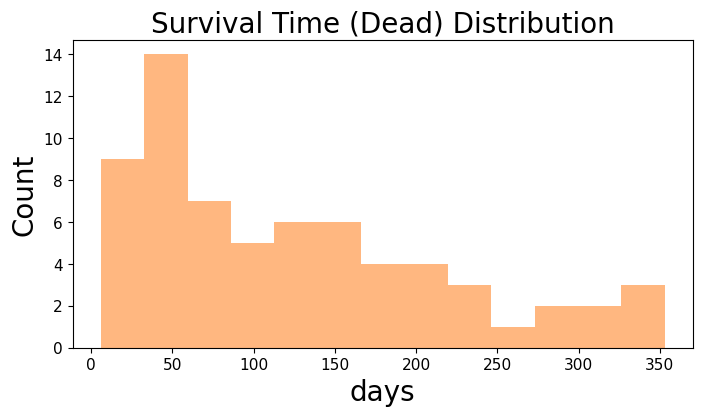

In [353]:
import numpy as np
import matplotlib
from matplotlib import pylab as plt

plt.figure(figsize=(8,4))
dataset = df[y == 1]['survival_time'].values

plt.hist(dataset, bins = int(np.sqrt(df.shape[0])), color="#ffb780")
plt.xlabel('days', fontsize=20)
plt.ylabel('Count', fontsize=20)
plt.title('Survival Time (Dead) Distribution', fontsize=20)
plt.show()

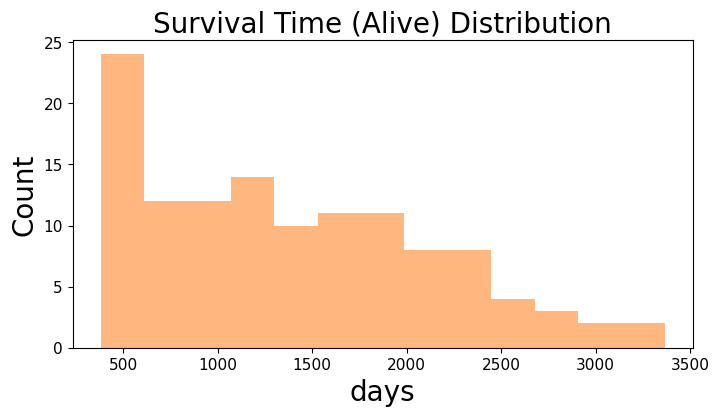

In [354]:
import numpy as np
import matplotlib
from matplotlib import pylab as plt

plt.figure(figsize=(8,4))
dataset = df[y == 0]['survival_time'].values

plt.hist(dataset, bins = int(np.sqrt(df.shape[0])), color="#ffb780")
plt.xlabel('days', fontsize=20)
plt.ylabel('Count', fontsize=20)
plt.title('Survival Time (Alive) Distribution', fontsize=20)
plt.show()

In [355]:
df[y == 1]['survival_time'].quantile(np.arange(0, 1, 0.1))

0.0      6.0
0.1     28.0
0.2     42.0
0.3     56.5
0.4     64.0
0.5    105.0
0.6    136.0
0.7    162.0
0.8    200.0
0.9    267.5
Name: survival_time, dtype: float64

In [356]:
def basic_split(X,y,train_size, val_size, test_size, random_state):
    from sklearn.model_selection import train_test_split
    import numpy as np 
    if train_size + test_size + val_size != 1:
        print("The size of train set, valuation set, and test sets are wrong.")
    elif random_state.is_integer() == False:
        print("The random state input is wrong.")
    else:
        X_train, X_other, y_train, y_other = train_test_split(X,y,train_size = train_size,random_state = random_state, stratify=y)
        actual_test_size = test_size/(1-train_size)
        X_val, X_test, y_val, y_test = train_test_split(X_other,y_other, test_size = actual_test_size,random_state = random_state, stratify=y_other)
        if np.isclose(X_val.shape[0]/X.shape[0], val_size, rtol=0.03) and np.isclose(X_train.shape[0]/X.shape[0], train_size, rtol=0.03) and np.isclose(X_test.shape[0]/X.shape[0], test_size, rtol=0.03):
            print('training set:',X_train.shape, y_train.shape) 
            print('validation set:', X_val.shape, y_val.shape) 
            print('test set:', X_test.shape, y_test.shape) 
            return X_train, X_val, X_test, y_train, y_val, y_test
        else:
            print('Error: The data can not be splitted using this function.')
            print(f"validation: {X_val.shape[0]/X.shape[0]}, {val_size}")
            print(f"train {X_train.shape[0]/X.shape[0]}, {train_size}")
            print(f"test: {X_test.shape[0]/X.shape[0]}, {test_size}")

#X_train, X_val, X_test, y_train, y_val, y_test = basic_split(X, y, train_size=0.6, val_size=0.2, test_size=0.2, random_state=42)

In [361]:
X.columns

Index(['Recipientgender', 'Stemcellsource', 'Donorage', 'IIIV', 'Gendermatch',
       'DonorABO', 'RecipientABO', 'RecipientRh', 'ABOmatch', 'CMVstatus',
       'DonorCMV', 'RecipientCMV', 'Disease', 'Riskgroup', 'Txpostrelapse',
       'Diseasegroup', 'HLAmatch', 'HLAmismatch', 'Antigen', 'Alel', 'HLAgrI',
       'Recipientage', 'Relapse', 'aGvHDIIIIV', 'extcGvHD', 'CD34kgx10d6',
       'CD3dCD34', 'CD3dkgx10d8', 'Rbodymass', 'ANCrecovery', 'PLTrecovery',
       'time_to_aGvHD_III_IV'],
      dtype='object')

In [365]:
#XGB preprocessing

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import make_pipeline


ordinal_ftrs = ['CMVstatus', 'HLAmatch', 'Antigen', 'Alel', 'HLAgrI', 'Donorage35', 'Recipientage10', 'Recipientageint'] 
# CMVstatus: (the higher the value the lower the compatibility)
ordinal_cats = [[0,1,2,3,10], [0,1,2,3,10], [-1, 0, 1, 2, 10], [-1, 0, 1, 2, 3, 10], 
                [0,1,2,3,4,5,6,7, 10], [0,1], [0,1], [0,1,2]] 

onehot_ftrs = ['Recipientgender', 'Stemcellsource', 'IIIV',
       'Gendermatch', 'DonorABO', 'RecipientABO', 'RecipientRh', 'ABOmatch',
       'DonorCMV', 'RecipientCMV', 'Disease', 'Riskgroup',
       'Txpostrelapse', 'HLAmismatch',
       'Relapse', 'aGvHDIIIIV', 'extcGvHD']

minmax_ftrs = ['Donorage','Recipientage']

std_ftrs = ['CD34kgx10d6', 'CD3dCD34', 'CD3dkgx10d8', 'Rbodymass', 'ANCrecovery', 'PLTrecovery',
       'time_to_aGvHD_III_IV']

categorical_transformer = Pipeline(steps=[    
    ('imputer2', SimpleImputer(strategy='constant', fill_value=-10)),    
    ('onehot', OneHotEncoder(sparse_output=False,handle_unknown='ignore', drop="first"))])
ordinal_transformer = Pipeline(steps=[
    ('imputer3', SimpleImputer(strategy='constant', fill_value=10)),
    ('ordinal', OrdinalEncoder(categories = ordinal_cats))])
# collect all the encoders
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', categorical_transformer, onehot_ftrs),
        ('ord', ordinal_transformer, ordinal_ftrs),
        ('minmax', MinMaxScaler(), minmax_ftrs),
        ('std', StandardScaler(), std_ftrs)])
clf = make_pipeline(preprocessor, StandardScaler())


In [366]:
# matrix set:
from sklearn.metrics import make_scorer,fbeta_score

def f2_func(y_true, y_pred):
    f2_score = fbeta_score(y_true, y_pred, beta=2)
    return f2_score

def my_f2_scorer():
    return make_scorer(f2_func)

In [360]:
#for i in onehot_ftrs:
    #if len(X_train[i].unique()) <= 1:
     #   print(i)
    #else:
     #   print('nothing')

In [ ]:
import xgboost
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import numpy as np 
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score

param_grid = {"learning_rate": [0.01, 0.03, 0.1, 0.3],
              "n_estimators": [10000],
              "seed": [0],
              "reg_alpha": [0e0, 1e-2, 1e-1, 1e0, 1e1, 1e2],
              #"reg_lambda": [0e0, 1e-2, 1e-1, 1e0, 1e1, 1e2],
              "missing": [np.nan], 
              "max_depth": [1,3,10,30,100],
              "colsample_bytree": [0.9],              
              "subsample": [0.66]}

test_score_all = []

CV_score_all = []

CV_mean_list = []

best_params_list = []
for random_state in range(10):
    X_other, X_test, y_other, y_test = train_test_split(X,y,
                        test_size = 0.2, random_state = random_state*42, stratify=y)
    kfold = StratifiedKFold(n_splits=4, shuffle=True, random_state = random_state*42)
    CV_mean = []
    CV_std = []
    for i in range(len(ParameterGrid(param_grid))):
        XGB = xgboost.XGBClassifier()
        XGB.set_params(**ParameterGrid(param_grid)[i],early_stopping_rounds=50)
        CV_score = []
        for fold_number, (X_train_index, X_CV_index) in enumerate(kfold.split(X_other, y_other)):
            X_train, y_train = X_other.iloc[X_train_index], y_other.iloc[X_train_index]
            X_CV, y_CV = X_other.iloc[X_CV_index], y_other.iloc[X_CV_index]    
            
            #preprocessing
            X_train_prep = clf.fit_transform(X_train)
            X_CV_prep = clf.transform(X_CV)
            X_test_prep = clf.transform(X_test)
            
            #XGB predicting
            XGB.fit(X_train_prep,y_train,eval_set=[(X_CV_prep, y_CV)], verbose=False)
            y_CV_pred = XGB.predict(X_CV_prep)
            i_CV_score = f2_func(y_CV,y_CV_pred)
            CV_score_all.append(i_CV_score)
            CV_score.append(i_CV_score)
        CV_mean.append(np.mean(CV_score))
        CV_std.append(np.std(CV_score))

    best_params_list.append(ParameterGrid(param_grid)[np.argmax(CV_mean)])
    CV_mean_list.append(np.mean(CV_mean))
    XGB.set_params(**ParameterGrid(param_grid)[np.argmax(CV_mean)],early_stopping_rounds=50)
    XGB.fit(X_train_prep,y_train,eval_set=[(X_CV_prep, y_CV)], verbose=False)
    y_test_pred = XGB.predict(X_test_prep)
    test_score = f2_func(y_test,y_test_pred)
    test_score_all.append(test_score)


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [5, 7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [8] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [5, 7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [8] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030

In [132]:
best_params_list

[{'subsample': 0.66,
  'seed': 0,
  'reg_lambda': 0.01,
  'reg_alpha': 0.01,
  'n_estimators': 10000,
  'missing': nan,
  'max_depth': 3,
  'learning_rate': 0.3,
  'colsample_bytree': 0.9},
 {'subsample': 0.66,
  'seed': 0,
  'reg_lambda': 1.0,
  'reg_alpha': 0.1,
  'n_estimators': 10000,
  'missing': nan,
  'max_depth': 1,
  'learning_rate': 0.1,
  'colsample_bytree': 0.9},
 {'subsample': 0.66,
  'seed': 0,
  'reg_lambda': 0.1,
  'reg_alpha': 0.01,
  'n_estimators': 10000,
  'missing': nan,
  'max_depth': 10,
  'learning_rate': 0.3,
  'colsample_bytree': 0.9},
 {'subsample': 0.66,
  'seed': 0,
  'reg_lambda': 0.1,
  'reg_alpha': 0.1,
  'n_estimators': 10000,
  'missing': nan,
  'max_depth': 3,
  'learning_rate': 0.3,
  'colsample_bytree': 0.9},
 {'subsample': 0.66,
  'seed': 0,
  'reg_lambda': 0.0,
  'reg_alpha': 0.0,
  'n_estimators': 10000,
  'missing': nan,
  'max_depth': 3,
  'learning_rate': 0.3,
  'colsample_bytree': 0.9},
 {'subsample': 0.66,
  'seed': 0,
  'reg_lambda': 0.0,
 

In [134]:
best_params_list[np.argmax(test_score_all)]

{'subsample': 0.66,
 'seed': 0,
 'reg_lambda': 0.1,
 'reg_alpha': 0.01,
 'n_estimators': 10000,
 'missing': nan,
 'max_depth': 10,
 'learning_rate': 0.3,
 'colsample_bytree': 0.9}

In [785]:
#之前的内容
best_params_list[np.argmax(test_score_all)]

{'subsample': 0.66,
 'seed': 0,
 'n_estimators': 10000,
 'missing': nan,
 'max_depth': 10,
 'learning_rate': 0.3,
 'colsample_bytree': 0.9}

In [333]:
np.mean(test_score_all)

0.5211094331325108

In [459]:
best_params_list[np.argmax(test_score_all)]

{'subsample': 0.66,
 'seed': 0,
 'n_estimators': 10000,
 'missing': nan,
 'max_depth': 3,
 'learning_rate': 0.1,
 'colsample_bytree': 0.9}

In [368]:
# second time with more features

param_grid = {"learning_rate": [0.01, 0.03, 0.1, 0.3],
              "n_estimators": [10000],
              "seed": [0],
              "reg_alpha": [0e0, 1e-2, 1e-1, 1e0, 1e1, 1e2],
              #"reg_lambda": [0e0, 1e-2, 1e-1, 1e0, 1e1, 1e2],
              "missing": [np.nan], 
              "max_depth": [1,3,10,30,100],
              "colsample_bytree": [0.9],              
              "subsample": [0.66]}

test_score_all_2 = []
CV_score_all_2 = []
CV_mean_list_2 = []
best_params_list_2 = []

for random_state in range(10):
    X_other, X_test, y_other, y_test = train_test_split(X,y,
                        test_size = 0.2, random_state = random_state*42, stratify=y)
    kfold = StratifiedKFold(n_splits=4, shuffle=True, random_state = random_state*42)
    CV_mean = []
    CV_std = []
    for i in range(len(ParameterGrid(param_grid))):
        XGB = xgboost.XGBClassifier()
        XGB.set_params(**ParameterGrid(param_grid)[i],early_stopping_rounds=50)
        CV_score = []
        for fold_number, (X_train_index, X_CV_index) in enumerate(kfold.split(X_other, y_other)):
            X_train, y_train = X_other.iloc[X_train_index], y_other.iloc[X_train_index]
            X_CV, y_CV = X_other.iloc[X_CV_index], y_other.iloc[X_CV_index]    
            
            #preprocessing
            X_train_prep = clf.fit_transform(X_train)
            X_CV_prep = clf.transform(X_CV)
            X_test_prep = clf.transform(X_test)
            
            #XGB predicting
            XGB.fit(X_train_prep,y_train,eval_set=[(X_CV_prep, y_CV)], verbose=False)
            y_CV_pred = XGB.predict(X_CV_prep)
            i_CV_score = f2_func(y_CV,y_CV_pred)
            CV_score_all_2.append(i_CV_score)
            CV_score.append(i_CV_score)
        CV_mean.append(np.mean(CV_score))
        CV_std.append(np.std(CV_score))

    best_params_list_2.append(ParameterGrid(param_grid)[np.argmax(CV_mean)])
    CV_mean_list_2.append(np.mean(CV_mean))
    XGB.set_params(**ParameterGrid(param_grid)[np.argmax(CV_mean)],early_stopping_rounds=50)
    XGB.fit(X_train_prep,y_train,eval_set=[(X_CV_prep, y_CV)], verbose=False)
    y_test_pred = XGB.predict(X_test_prep)
    test_score = f2_func(y_test,y_test_pred)
    test_score_all_2.append(test_score)

c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [5, 7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [8] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [5, 7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [8] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030

In [369]:
test_score_all_2

[0.4838709677419355,
 0.423728813559322,
 0.6557377049180327,
 0.6451612903225806,
 0.7142857142857143,
 0.5833333333333334,
 0.5555555555555556,
 0.4032258064516129,
 0.5737704918032787,
 0.5645161290322581]

In [371]:
print(np.mean(test_score_all))
print(np.std(test_score_all))

0.5211094331325108
0.09815795779133424


In [378]:
print(XGB.reg_lambda)

None


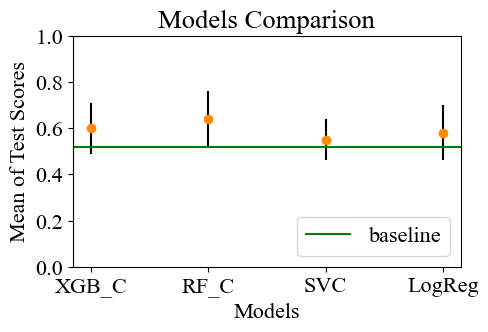

In [449]:
x = [1, 2, 3, 4]
y = [0.60, 0.64, 0.55, 0.58]
yerr = [0.11, 0.12, 0.09, 0.12]
f1 = 0.52

plt.rcParams['font.size'] = 16
plt.rcParams['font.sans-serif'] = 'Times New Roman'
plt.figure(figsize=(5,3))
plt.errorbar(x, y, yerr=yerr,  color='darkorange', fmt="o", ecolor = "black")
plt.title('Models Comparison')
plt.ylabel('Mean of Test Scores')
plt.xlabel('Models')
plt.xticks([1,2,3,4], ['XGB_C', 'RF_C', 'SVC', 'LogReg'])
plt.ylim(bottom=0, top=1)
plt.axhline(f1,label='baseline', c = 'green')
plt.legend(loc=4)
plt.show()

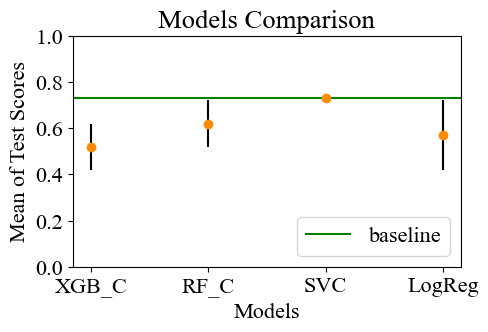

In [534]:
x = [1, 2, 3, 4]
y = [0.52, 0.62, 0.73, 0.57]
yerr = [0.10, 0.10, 0.0, 0.15]
f2 = 0.73

plt.rcParams['font.size'] = 16
plt.rcParams['font.sans-serif'] = 'Times New Roman'
plt.figure(figsize=(5,3))
plt.errorbar(x, y, yerr=yerr,  color='darkorange', fmt="o", ecolor = "black")
plt.title('Models Comparison')
plt.ylabel('Mean of Test Scores')
plt.xlabel('Models')
plt.xticks([1,2,3,4], ['XGB_C', 'RF_C', 'SVC', 'LogReg'])
plt.ylim(bottom=0, top=1)
plt.axhline(f2,label='baseline', c = 'green')
plt.legend(loc=4)
plt.show()

In [491]:
for random_state in range(10):
    X_other, X_test, y_other, y_test = train_test_split(X,y,
                        test_size = 0.2, random_state = random_state*100, stratify=y)
    X_train, X_val, y_train, y_val = train_test_split(X_other,y_other,
                        test_size = 0.25, random_state = random_state*7, stratify=y_other)
    X_train_prep = clf.fit_transform(X_train)
    X_val_prep = clf.transform(X_val)
    X_test_prep = clf.transform(X_test)
    XGB.set_params(**ParameterGrid(param_grid)[8],early_stopping_rounds=50)
    XGB.fit(X_train_prep,y_train,eval_set=[(X_val_prep, y_val)], verbose=False)
    score_val = accuracy_score(y_val, XGB.predict(X_val_prep))
    score_test = accuracy_score(y_test, XGB.predict(X_test_prep))
    print(f'validation score is {score_val}, and test score is {score_test}')

    

validation score is 0.7105263157894737, and test score is 0.6578947368421053
validation score is 0.7105263157894737, and test score is 0.6578947368421053


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [5, 7, 8] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


validation score is 0.7631578947368421, and test score is 0.6578947368421053
validation score is 0.7105263157894737, and test score is 0.8157894736842105


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [6, 8] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [5, 6, 7, 8] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


validation score is 0.7894736842105263, and test score is 0.7105263157894737


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [5, 7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


validation score is 0.6578947368421053, and test score is 0.7105263157894737
validation score is 0.7368421052631579, and test score is 0.7368421052631579
validation score is 0.7631578947368421, and test score is 0.7368421052631579


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [5, 6, 7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


validation score is 0.8157894736842105, and test score is 0.7368421052631579
validation score is 0.7368421052631579, and test score is 0.7368421052631579


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [5, 6, 7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [438]:
#other models: Random Forest, SVC, logistic regression

from sklearn.model_selection import ParameterGrid
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import numpy as np 
from sklearn.model_selection import StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import make_pipeline


df_c = df.dropna(subset=['Rbodymass']) #drop the row where Rbodymass is null
X2 = df_c.drop(labels=['survival_status', 'survival_time','1_year_survival_status', 'ANCrecovery', 'PLTrecovery', 'time_to_aGvHD_III_IV'], axis=1)
y2 = df_c['1_year_survival_status']


In [439]:
#X2['ANCrecovery'] = X2['ANCrecovery'].fillna(-100)
#X2['PLTrecovery'] = X2['PLTrecovery'].fillna(-100)
#X2['time_to_aGvHD_III_IV'] = X2['time_to_aGvHD_III_IV'].fillna(-100)
X2['CD3dCD34'] = X2['CD3dCD34'].fillna(-100)
X2['CD3dkgx10d8'] = X2['CD3dkgx10d8'].fillna(-100)

In [455]:
dataset = df_c['ANCrecovery']
sub = np.zeros(X2.shape[0])
for i,val in enumerate(dataset):
    if np.isnan(val):
        sub[i] = 10
X2['ANCrecovery_bool'] = list(sub)

dataset = df_c['PLTrecovery']
sub = np.zeros(X2.shape[0])
for i,val in enumerate(dataset):
    if np.isnan(val):
        sub[i] = 10
X2['PLTrecovery_bool'] = list(sub)

dataset = df_c['time_to_aGvHD_III_IV']
sub = np.zeros(X2.shape[0])
for i,val in enumerate(dataset):
    if np.isnan(val):
        sub[i] = 10
X2['time_to_aGvHD_III_IV_bool'] = list(sub)

In [434]:
X2.columns

Index(['Recipientgender', 'Stemcellsource', 'Donorage', 'Donorage35', 'IIIV',
       'Gendermatch', 'DonorABO', 'RecipientABO', 'RecipientRh', 'ABOmatch',
       'CMVstatus', 'DonorCMV', 'RecipientCMV', 'Disease', 'Riskgroup',
       'Txpostrelapse', 'Diseasegroup', 'HLAmatch', 'HLAmismatch', 'Antigen',
       'Alel', 'HLAgrI', 'Recipientage', 'Recipientage10', 'Recipientageint',
       'Relapse', 'aGvHDIIIIV', 'extcGvHD', 'CD34kgx10d6', 'CD3dCD34',
       'CD3dkgx10d8', 'Rbodymass', 'ANCrecovery_bool', 'PLTrecovery_bool',
       'time_to_aGvHD_III_IV_bool'],
      dtype='object')

In [255]:
df.columns

Index(['Recipientgender', 'Stemcellsource', 'Donorage', 'Donorage35', 'IIIV',
       'Gendermatch', 'DonorABO', 'RecipientABO', 'RecipientRh', 'ABOmatch',
       'CMVstatus', 'DonorCMV', 'RecipientCMV', 'Disease', 'Riskgroup',
       'Txpostrelapse', 'Diseasegroup', 'HLAmatch', 'HLAmismatch', 'Antigen',
       'Alel', 'HLAgrI', 'Recipientage', 'Recipientage10', 'Recipientageint',
       'Relapse', 'aGvHDIIIIV', 'extcGvHD', 'CD34kgx10d6', 'CD3dCD34',
       'CD3dkgx10d8', 'Rbodymass', 'ANCrecovery', 'PLTrecovery',
       'time_to_aGvHD_III_IV', 'survival_time', 'survival_status',
       '1_year_survival_status'],
      dtype='object')

In [450]:
X2.columns

Index(['Recipientgender', 'Stemcellsource', 'Donorage', 'Donorage35', 'IIIV',
       'Gendermatch', 'DonorABO', 'RecipientABO', 'RecipientRh', 'ABOmatch',
       'CMVstatus', 'DonorCMV', 'RecipientCMV', 'Disease', 'Riskgroup',
       'Txpostrelapse', 'Diseasegroup', 'HLAmatch', 'HLAmismatch', 'Antigen',
       'Alel', 'HLAgrI', 'Recipientage', 'Recipientage10', 'Recipientageint',
       'Relapse', 'aGvHDIIIIV', 'extcGvHD', 'CD34kgx10d6', 'CD3dCD34',
       'CD3dkgx10d8', 'Rbodymass', 'ANCrecovery_bool', 'PLTrecovery_bool',
       'time_to_aGvHD_III_IV_bool'],
      dtype='object')

In [581]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

In [474]:
#ftrs: ,
ordinal_ftrs = ['CMVstatus', 'HLAmatch', 'Antigen', 'Alel', 'HLAgrI', 'IIIV', 'Donorage35', 'Recipientage10', 'Recipientageint', 'ANCrecovery_bool', 'PLTrecovery_bool', 'time_to_aGvHD_III_IV_bool'] 
# CMVstatus: (the higher the value the lower the compatibility)
ordinal_cats = [[0,1,2,3,10], [0,1,2,3,10], [-1, 0, 1, 2, 10], [-1, 0, 1, 2, 3, 10], 
                [0,1,2,3,4,5,6,7, 10], [0, 1], [0,1], [0,1], [0,1,2], [0,10], [0,10], [0,10]] 


# ftr: , 
onehot_ftrs = ['Recipientgender', 'Stemcellsource',
       'Gendermatch', 'DonorABO', 'RecipientABO', 'RecipientRh', 'ABOmatch',
       'DonorCMV', 'RecipientCMV', 'Disease', 'Riskgroup',
       'Txpostrelapse', 'HLAmismatch',
       'Relapse', 'aGvHDIIIIV','extcGvHD']

minmax_ftrs = ['Donorage','Recipientage']

std_ftrs = ['CD34kgx10d6','CD3dCD34','CD3dkgx10d8', 'Rbodymass']

categorical_transformer = Pipeline(steps=[    
    ('imputer2', SimpleImputer(strategy='constant', fill_value=-10)),    
    ('onehot', OneHotEncoder(sparse_output=False,handle_unknown='ignore', drop="first"))])
#, drop="first"
ordinal_transformer = Pipeline(steps=[
    ('imputer3', SimpleImputer(strategy='constant', fill_value=10)),
    ('ordinal', OrdinalEncoder(categories = ordinal_cats))])
# collect all the encoders
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', categorical_transformer, onehot_ftrs),
        ('ord', ordinal_transformer, ordinal_ftrs),
        ('minmax', MinMaxScaler(), minmax_ftrs),
        ('std', StandardScaler(), std_ftrs)])




In [475]:
q = preprocessor.fit_transform(X2)

pp_feature_names = preprocessor.get_feature_names_out()
pp_feature_names
q.shape

(185, 47)

In [476]:
#Y = pd.DataFrame(list(y2), columns=['1_yr_survival_rate'])
Q = pd.DataFrame(q, columns = pp_feature_names)
Q['1_yr_survival_rate'] = y2

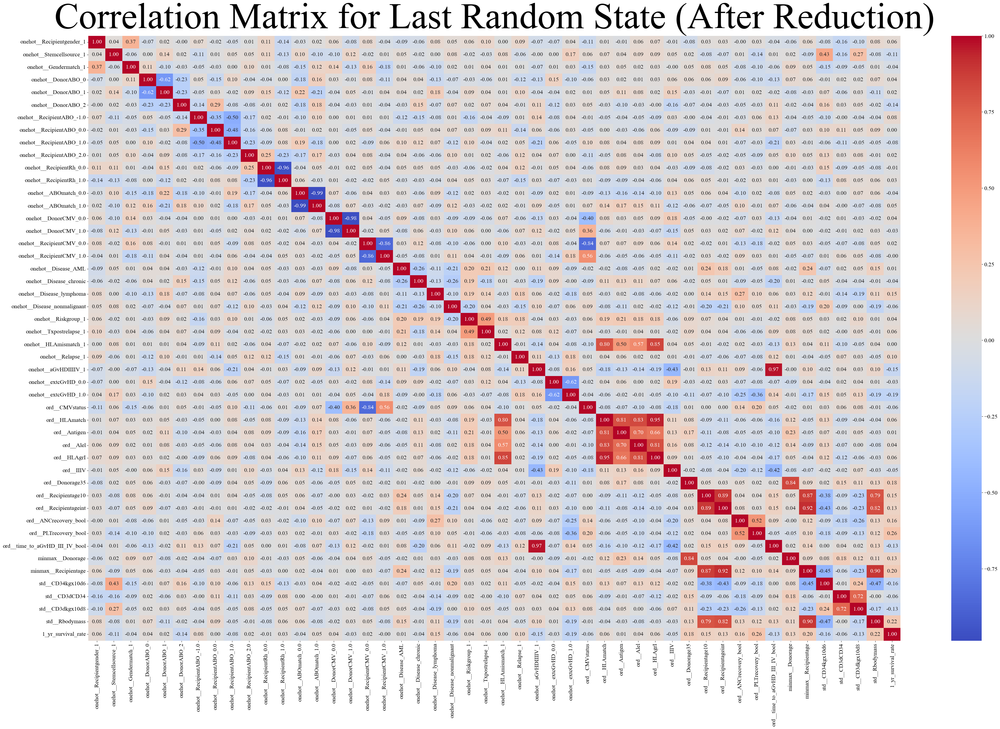

In [477]:
import seaborn as sns
correlation_matrix = Q.corr()

# Plot the correlation matrix
plt.rcParams['font.size'] = 16
plt.figure(figsize=(50,30))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title("Correlation Matrix for Last Random State (After Reduction)", fontsize = 100)
plt.show()



In [479]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

In [480]:
param_grid_SVC = {'svc__C': [0.01, 0.1, 1, 10, 100],
            'svc__gamma': [0.01, 0.1, 1, 10, 100]}
test_score_SVC = []
best_model_SVC = []
for random_state in range(10):
    X_other_2, X_test_2, y_other_2, y_test_2 = train_test_split(X2,y2,
                        test_size = 0.2, random_state = random_state*42, stratify=y2)
    kfold = StratifiedKFold(n_splits=4, shuffle=True, random_state = random_state*42)
    
    clf_SVC = make_pipeline(preprocessor, StandardScaler(), SVC(random_state = random_state, class_weight = 'balanced'))
    grid_SVC = GridSearchCV(clf_SVC, param_grid=param_grid_SVC, cv=kfold, scoring=my_f2_scorer(), return_train_score = True,n_jobs=-1,verbose=True)
    # do kfold CV on _other
    grid_SVC.fit(X_other_2, y_other_2)
    print(grid_SVC.best_score_)
    test_score_SVC.append(grid_SVC.score(X_test_2,y_test_2))
    print(grid_SVC.score(X_test_2,y_test_2))
    best_model_SVC.append(grid_SVC.best_estimator_)
    print(grid_SVC.best_params_)
    

   

Fitting 4 folds for each of 25 candidates, totalling 100 fits
0.7303370786516854
0.7303370786516854
{'svc__C': 0.1, 'svc__gamma': 0.01}
Fitting 4 folds for each of 25 candidates, totalling 100 fits
0.7303370786516854
0.7386363636363636
{'svc__C': 0.1, 'svc__gamma': 0.01}
Fitting 4 folds for each of 25 candidates, totalling 100 fits


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


0.7303370786516854
0.7386363636363636
{'svc__C': 0.1, 'svc__gamma': 0.01}
Fitting 4 folds for each of 25 candidates, totalling 100 fits
0.7303370786516854
0.7386363636363636
{'svc__C': 0.1, 'svc__gamma': 0.01}
Fitting 4 folds for each of 25 candidates, totalling 100 fits


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


0.7303370786516854
0.7303370786516854
{'svc__C': 0.1, 'svc__gamma': 0.01}
Fitting 4 folds for each of 25 candidates, totalling 100 fits
0.7303370786516854
0.7303370786516854
{'svc__C': 0.1, 'svc__gamma': 0.01}
Fitting 4 folds for each of 25 candidates, totalling 100 fits
0.7303370786516854
0.7386363636363636
{'svc__C': 0.1, 'svc__gamma': 0.01}
Fitting 4 folds for each of 25 candidates, totalling 100 fits
0.7303370786516854
0.7386363636363636
{'svc__C': 0.1, 'svc__gamma': 0.01}
Fitting 4 folds for each of 25 candidates, totalling 100 fits
0.7303370786516854
0.7303370786516854
{'svc__C': 0.1, 'svc__gamma': 0.01}
Fitting 4 folds for each of 25 candidates, totalling 100 fits
0.7303370786516854
0.7303370786516854
{'svc__C': 0.1, 'svc__gamma': 0.01}


In [481]:
test_score_SVC

[0.7303370786516854,
 0.7386363636363636,
 0.7386363636363636,
 0.7386363636363636,
 0.7303370786516854,
 0.7303370786516854,
 0.7386363636363636,
 0.7386363636363636,
 0.7303370786516854,
 0.7303370786516854]

In [484]:
print(np.mean(test_score_SVC))
print(np.std(test_score_SVC))

0.7344867211440246
0.004149642492339123


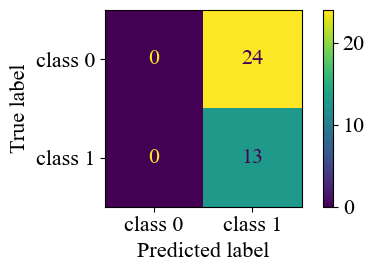

In [483]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

# overall accuracy and confusion matrix for males
y_true = y_test_2
y_pred = grid_SVC.predict(X_test_2)
cm = confusion_matrix(y_true,y_pred)
disp = ConfusionMatrixDisplay(cm,display_labels=['class 0', 'class 1'])
fig, ax = plt.subplots(figsize=(5,3))
disp.plot(ax=ax)
plt.tight_layout()
plt.show()

test score =  0.35135135135135137
test baseline =  0.6486486486486487
shuffling Recipientgender
   shuffled test score: 0.351 +/- 0.0
shuffling Stemcellsource
   shuffled test score: 0.351 +/- 0.0
shuffling Donorage
   shuffled test score: 0.351 +/- 0.0
shuffling Donorage35
   shuffled test score: 0.351 +/- 0.0
shuffling IIIV
   shuffled test score: 0.351 +/- 0.0
shuffling Gendermatch
   shuffled test score: 0.351 +/- 0.0
shuffling DonorABO
   shuffled test score: 0.351 +/- 0.0
shuffling RecipientABO
   shuffled test score: 0.351 +/- 0.0
shuffling RecipientRh
   shuffled test score: 0.351 +/- 0.0
shuffling ABOmatch
   shuffled test score: 0.351 +/- 0.0
shuffling CMVstatus
   shuffled test score: 0.351 +/- 0.0
shuffling DonorCMV
   shuffled test score: 0.351 +/- 0.0
shuffling RecipientCMV
   shuffled test score: 0.351 +/- 0.0
shuffling Disease
   shuffled test score: 0.351 +/- 0.0
shuffling Riskgroup
   shuffled test score: 0.351 +/- 0.0
shuffling Txpostrelapse
   shuffled test score: 0

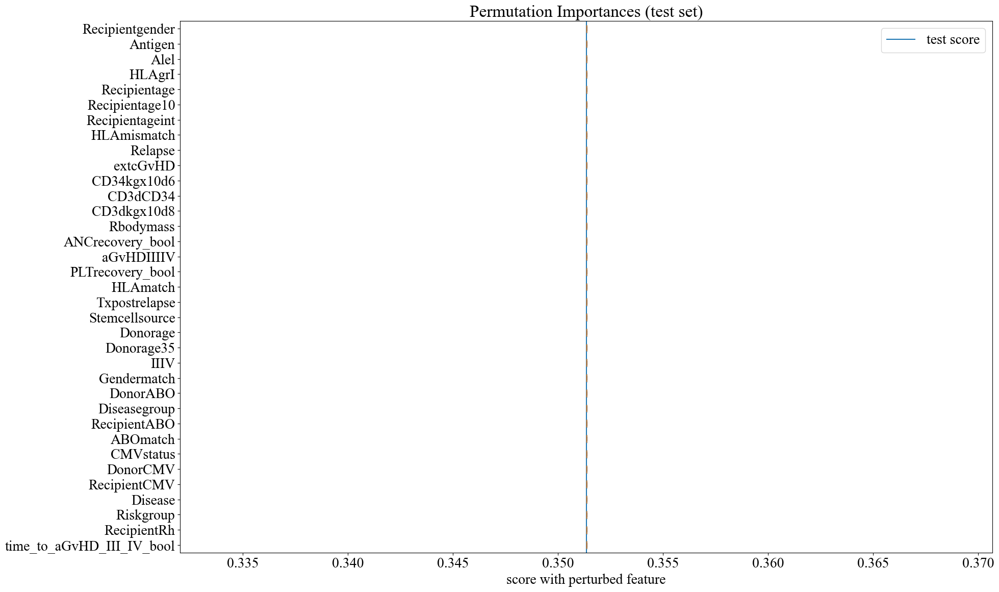

In [485]:
np.random.seed(42)

nr_runs = 10
scores = np.zeros([X2.shape[1],nr_runs])

test_score = best_model_SVC[2].score(X_test_2,y_test_2)
print('test score = ',test_score)
print('test baseline = ',np.sum(y_test_2 == 0)/len(y_test_2))
# loop through the features
for i in range(X2.shape[1]):
    print('shuffling '+str(X2.columns[i]))
    acc_scores = []
    for j in range(nr_runs):
        X_test_shuffled = X_test_2.copy()
        X_test_shuffled[X2.columns[i]] = np.random.permutation(X_test_2[X2.columns[i]].values)
        acc_scores.append(best_model_SVC[2].score(X_test_shuffled,y_test_2))
    print('   shuffled test score:',np.around(np.mean(acc_scores),3),'+/-',np.around(np.std(acc_scores),3))
    scores[i] = acc_scores

ftr_names = X2.columns
sorted_indcs = np.argsort(np.mean(scores,axis=1))[::-1]
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(20,12))
plt.boxplot(scores[sorted_indcs].T,tick_labels=ftr_names[sorted_indcs],vert=False)
plt.axvline(test_score,label='test score')
plt.title("Permutation Importances (test set)")
plt.xlabel('score with perturbed feature')
plt.legend()
plt.tight_layout()
plt.show()

In [499]:
from sklearn.metrics import f1_score
param_grid_RF = {'randomforestclassifier__max_depth': [1, 3, 10, 30, 100], # no upper bound so the values are evenly spaced in log
                'randomforestclassifier__max_features': [0.25, 0.5,0.75,1.0] # linearly spaced because it is between 0 and 1, 0 is omitted
                } 
test_score_RF = []
best_model_RF = []
all_grid_RF = []
for random_state in range(10):
    X_other_2, X_test_2, y_other_2, y_test_2 = train_test_split(X2,y2,
                        test_size = 0.2, random_state = random_state*43, stratify=y2)
    kfold = StratifiedKFold(n_splits=4, shuffle=True, random_state = random_state*44)
    
    clf_RF = make_pipeline(preprocessor, StandardScaler(), RandomForestClassifier(random_state = random_state*13))
    grid_RF = GridSearchCV(clf_RF, param_grid=param_grid_RF, cv=kfold, scoring=my_f2_scorer(), return_train_score = True,n_jobs=-1,verbose=True)
    # do kfold CV on _other
    grid_RF.fit(X_other_2, y_other_2)
    #print(grid_RF.best_score_)
    test_score_RF.append(grid_RF.score(X_test_2,y_test_2))
    #print(grid_RF.score(X_test_2,y_test_2))
    best_model_RF.append(grid_RF.best_estimator_)
    #print(grid_RF.best_params_)
    all_grid_RF.append(grid_RF)
    y_pred = grid_RF.predict(X_test_2)
    #print(y_pred)
    #print(f1_score(y_test_2, y_pred))

Fitting 4 folds for each of 20 candidates, totalling 80 fits
Fitting 4 folds for each of 20 candidates, totalling 80 fits
Fitting 4 folds for each of 20 candidates, totalling 80 fits
Fitting 4 folds for each of 20 candidates, totalling 80 fits
Fitting 4 folds for each of 20 candidates, totalling 80 fits


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Fitting 4 folds for each of 20 candidates, totalling 80 fits
Fitting 4 folds for each of 20 candidates, totalling 80 fits
Fitting 4 folds for each of 20 candidates, totalling 80 fits
Fitting 4 folds for each of 20 candidates, totalling 80 fits
Fitting 4 folds for each of 20 candidates, totalling 80 fits


In [500]:
test_score_RF

[0.7575757575757576,
 0.625,
 0.4166666666666667,
 0.625,
 0.6060606060606061,
 0.5833333333333334,
 0.5737704918032787,
 0.7936507936507936,
 0.546875,
 0.6923076923076923]

In [501]:
print(np.mean(test_score_RF))
print(np.std(test_score_RF))

0.6220240341398129
0.10231654366639051


In [516]:
best_model_RF

[Pipeline(steps=[('columntransformer',
                  ColumnTransformer(transformers=[('onehot',
                                                   Pipeline(steps=[('imputer2',
                                                                    SimpleImputer(fill_value=-10,
                                                                                  strategy='constant')),
                                                                   ('onehot',
                                                                    OneHotEncoder(drop='first',
                                                                                  handle_unknown='ignore',
                                                                                  sparse_output=False))]),
                                                   ['Recipientgender',
                                                    'Stemcellsource',
                                                    'Gendermatch', 'DonorABO',
         

Fitting 4 folds for each of 20 candidates, totalling 80 fits


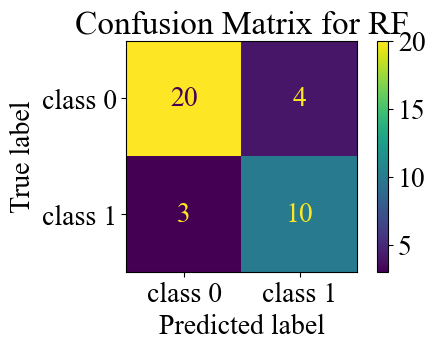

the number is  0
0.7575757575757576
Fitting 4 folds for each of 20 candidates, totalling 80 fits


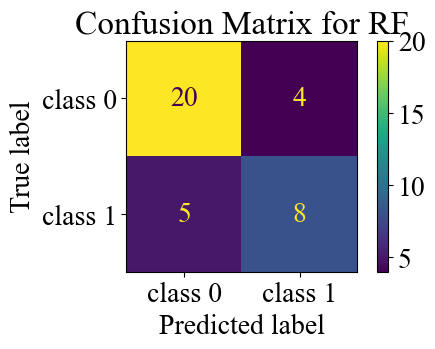

the number is  1
0.625
Fitting 4 folds for each of 20 candidates, totalling 80 fits


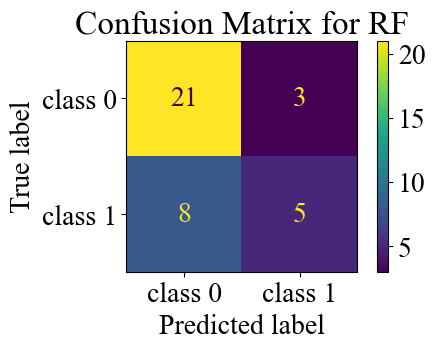

the number is  2
0.4166666666666667
Fitting 4 folds for each of 20 candidates, totalling 80 fits


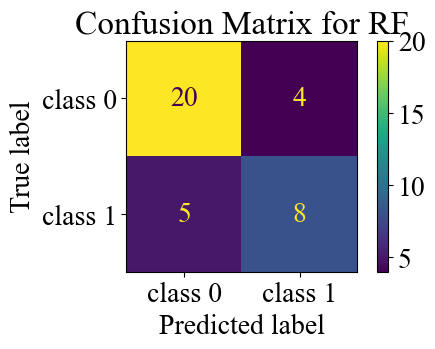

the number is  3
0.625
Fitting 4 folds for each of 20 candidates, totalling 80 fits


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


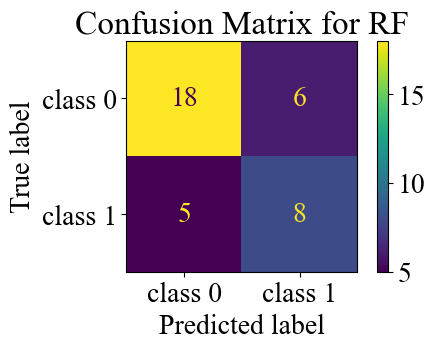

c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


the number is  4
0.6060606060606061
Fitting 4 folds for each of 20 candidates, totalling 80 fits


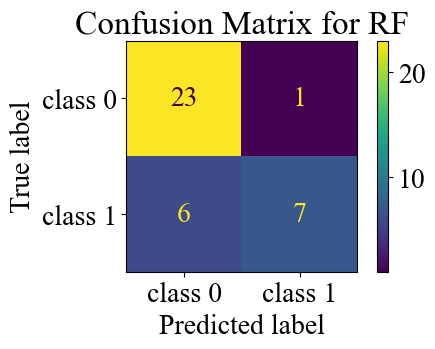

the number is  5
0.5833333333333334
Fitting 4 folds for each of 20 candidates, totalling 80 fits


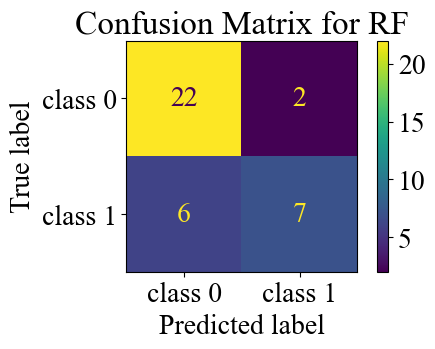

the number is  6
0.5737704918032787
Fitting 4 folds for each of 20 candidates, totalling 80 fits


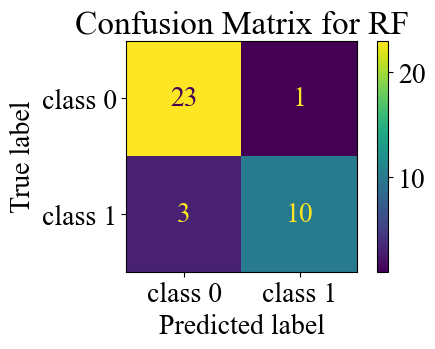

the number is  7
0.7936507936507936
Fitting 4 folds for each of 20 candidates, totalling 80 fits


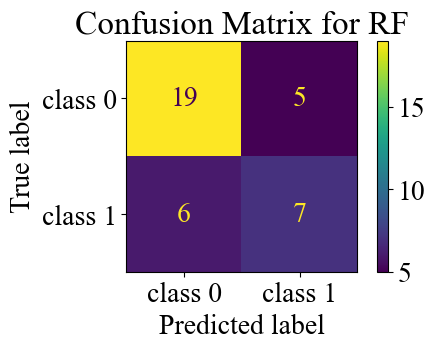

the number is  8
0.546875
Fitting 4 folds for each of 20 candidates, totalling 80 fits


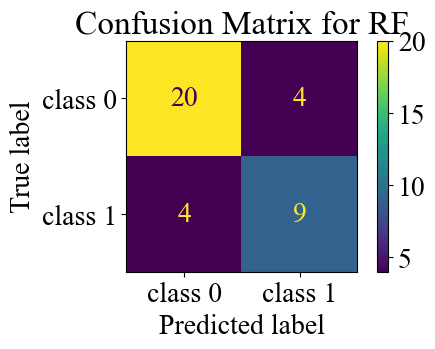

the number is  9
0.6923076923076923


In [508]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
plt.rcParams.update({'font.size': 20})
for i in range(10):
    X_other_2, X_test_2, y_other_2, y_test_2 = train_test_split(X2,y2,
                        test_size = 0.2, random_state = i*43, stratify=y2)
    all_grid_RF[i].fit(X_other_2, y_other_2)
    y_pred_2 = all_grid_RF[i].predict(X_test_2)
    cm = confusion_matrix(y_test_2,y_pred_2)
    disp = ConfusionMatrixDisplay(cm,display_labels=['class 0', 'class 1'])
    
    fig, ax = plt.subplots(figsize=(5,3))
    disp.plot(ax=ax)
    plt.title('Confusion Matrix for RF')
    plt.show()
    print('the number is ', i)
    print(all_grid_RF[i].score(X_test_2, y_test_2))

In [513]:
RF_importance =all_grid_RF[0].best_estimator_[-1].feature_importances_
feature_imp_df = pd.DataFrame({'Feature': pp_feature_names, 'Gini_Importance': RF_importance}).sort_values('Gini_Importance', ascending = 0)
feature_imp_df

,Feature,Gini_Importance
28,onehot__extcGvHD_1.0,0.237047
41,minmax__Donorage,0.095857
27,onehot__extcGvHD_0.0,0.069904
44,std__CD3dCD34,0.065909
39,ord__PLTrecovery_bool,0.062216
46,std__Rbodymass,0.059116
42,minmax__Recipientage,0.044428
43,std__CD34kgx10d6,0.043400
25,onehot__Relapse_1,0.040133
45,std__CD3dkgx10d8,0.035695


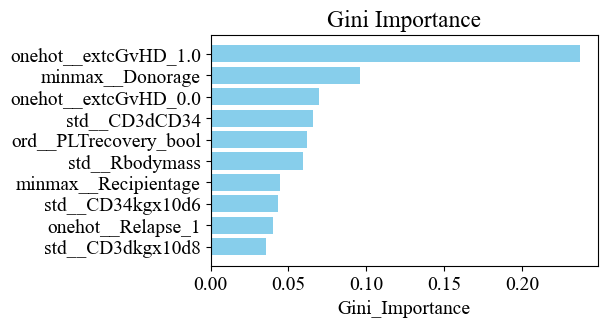

In [514]:
plt.figure(figsize=(5,3))
plt.rcParams.update({'font.size': 14})
plt.barh(feature_imp_df['Feature'][:10], feature_imp_df['Gini_Importance'][:10], color = 'skyblue')
plt.xlabel('Gini_Importance')
plt.title('Gini Importance')
plt.gca().invert_yaxis()
plt.show()

Fitting 4 folds for each of 20 candidates, totalling 80 fits
test score =  0.7575757575757576
test baseline =  0.73


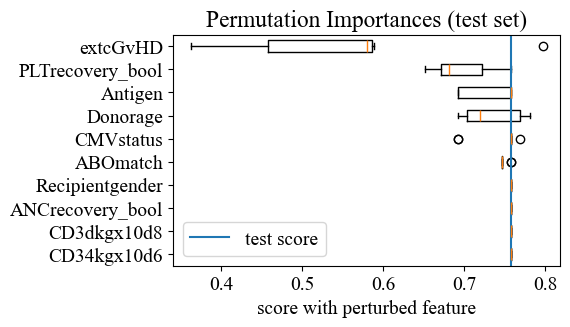

In [515]:
import matplotlib.pyplot as plt

np.random.seed(42)

nr_runs = 10
scores = np.zeros([X2.shape[1],nr_runs])
i = 0
X_other_2, X_test_2, y_other_2, y_test_2 = train_test_split(X2,y2,
                        test_size = 0.2, random_state = i*43, stratify=y2)
all_grid_RF[i].fit(X_other_2, y_other_2)
test_score = all_grid_RF[i].score(X_test_2,y_test_2)
print('test score = ',test_score)
print('test baseline = ',0.73)
# loop through the features
for i in range(X2.shape[1]):
    #print('shuffling '+str(X2.columns[i]))
    acc_scores = []
    for j in range(nr_runs):
        X_test_shuffled = X_test_2.copy()
        X_test_shuffled[X2.columns[i]] = np.random.permutation(X_test_2[X2.columns[i]].values)
        acc_scores.append(all_grid_RF[0].score(X_test_shuffled,y_test_2))
    #print('   shuffled test score:',np.around(np.mean(acc_scores),3),'+/-',np.around(np.std(acc_scores),3))
    scores[i] = acc_scores

ftr_names = X2.columns
sorted_indcs = np.argsort(np.mean(scores,axis=1))[::-1]
plt.rcParams.update({'font.size': 14})
plt.figure(figsize=(5,3))
plt.boxplot(scores[sorted_indcs][-10:].T,tick_labels=ftr_names[sorted_indcs][-10:],vert=False)
plt.axvline(test_score,label='test score')
plt.title("Permutation Importances (test set)")
plt.xlabel('score with perturbed feature')
plt.legend()
plt.show()

In [568]:
import shap
shap.initjs() # required for visualizations later on
# create the explainer object with the random forest model
explainer = shap.TreeExplainer(all_grid_RF[7].best_estimator_[-1])
# transform the test set
X_test_transformed = all_grid_RF[7].best_estimator_[0].transform(X_test_2)
print(np.shape(X_test_transformed))
# calculate shap values on the first 1000 points in the test
shap_values = explainer.shap_values(X_test_transformed[:1000])
print(np.shape(shap_values))

(37, 47)
(37, 47, 2)


In [571]:
index = 27 # the index of the point to explain
print(explainer.expected_value[1]) # we explain class 0 predictions! Change indices to 1 if you want to explain class 1 predictions!
plt.rcParams['font.size'] =16
shap.force_plot(explainer.expected_value[1], shap_values[index,:,1], features = X_test_transformed[index,:],feature_names = pp_feature_names)

0.35202702702702715


0.6479729729729728


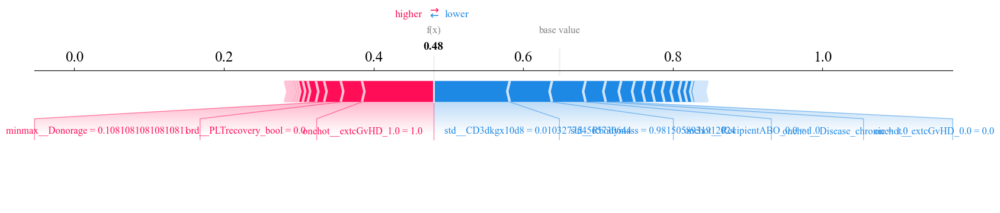

In [564]:
import matplotlib.pyplot as plt
index = 25 # the index of the point to explain
print(explainer.expected_value[0]) # we explain class 0 predictions! Change indices to 1 if you want to explain class 1 predictions!
plt.rcParams.update({'font.size': 18})

shap.force_plot(explainer.expected_value[0], shap_values[index,:,0], features = X_test_transformed[index,:],feature_names = pp_feature_names, matplotlib= True)


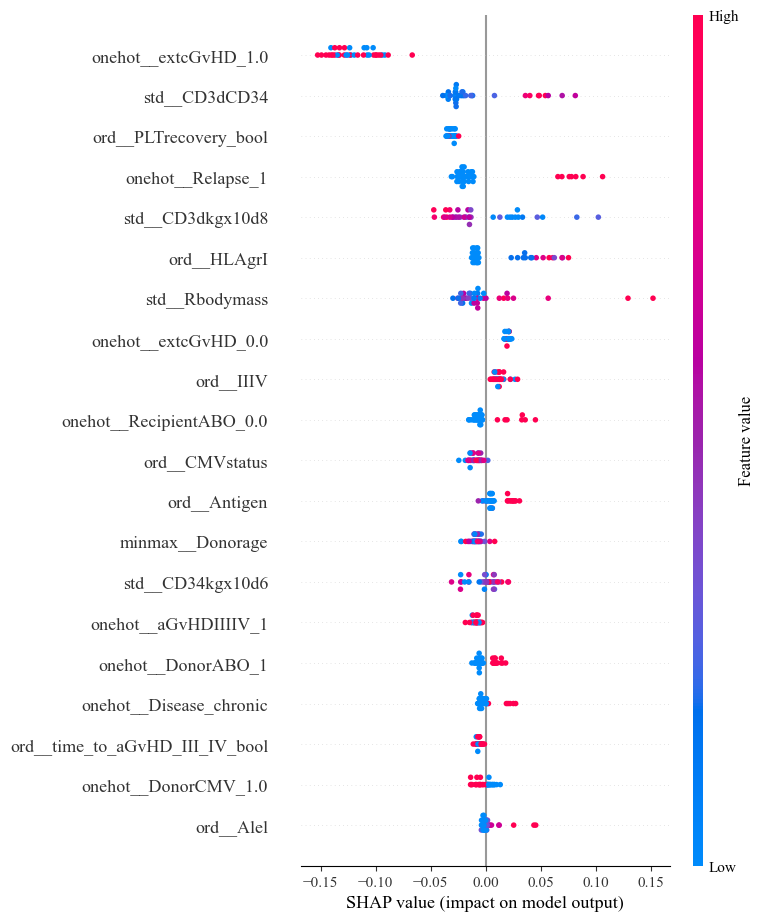

In [542]:
shap.summary_plot(shap_values[:,:,1], X_test_transformed[:1000],feature_names = pp_feature_names)

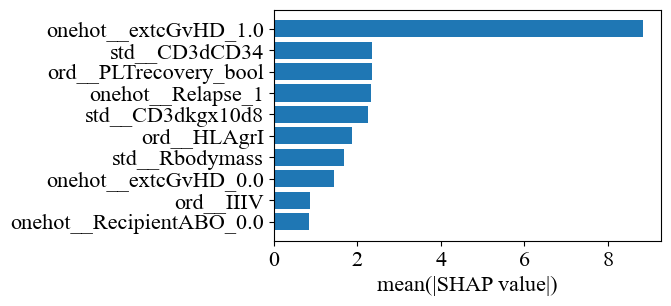

In [543]:
shap_summary = np.sum(np.abs(shap_values[:,:,1]),axis=0)+np.sum(np.abs(shap_values[:,:,0]),axis=0) # same shape as the number of features
indcs = np.argsort(shap_summary)
shap_summary[indcs]

plt.figure(figsize=(5,3))
plt.barh(pp_feature_names[indcs[-10:]],shap_summary[indcs[-10:]])
plt.xlabel('mean(|SHAP value|)')
plt.show()

In [531]:
#LogisticRegression
from sklearn.metrics import make_scorer,fbeta_score

def f2_func(y_true, y_pred):
    f2_score = fbeta_score(y_true, y_pred, beta=2)
    return f2_score

def my_f2_scorer():
    return make_scorer(f2_func)

param_grid_LR = {'logisticregression__C': [0.01, 0.1, 1, 10,100],
              'logisticregression__l1_ratio': [0, 0.2,0.4,0.6,0.8, 1]}
test_score_LR = []
best_model_LR = []
all_grid_LR = []
for random_state in range(10):
    X_other_2, X_test_2, y_other_2, y_test_2 = train_test_split(X2,y2,
                        test_size = 0.2, random_state = random_state*42, stratify=y2)
    kfold = StratifiedKFold(n_splits=4, shuffle=True, random_state = random_state*42)
    
    clf_LR = make_pipeline(preprocessor, StandardScaler(), LogisticRegression(penalty='elasticnet',solver='saga',max_iter=10000000, random_state = random_state))
    grid_LR = GridSearchCV(clf_LR, param_grid=param_grid_LR, cv=kfold, scoring=my_f2_scorer(), return_train_score = True,n_jobs=-1,verbose=True)
    # do kfold CV on X_other
    grid_LR.fit(X_other_2, y_other_2)
    print(grid_LR.best_score_)
    test_score_LR.append(grid_LR.score(X_test_2,y_test_2))
    print(grid_LR.score(X_test_2,y_test_2))
    best_model_LR.append(grid_LR.best_estimator_)
    print(grid_LR.best_params_)
    all_grid_LR.append(grid_LR)

Fitting 4 folds for each of 30 candidates, totalling 120 fits
0.563152349442672
0.7575757575757576
{'logisticregression__C': 0.1, 'logisticregression__l1_ratio': 0.8}
Fitting 4 folds for each of 30 candidates, totalling 120 fits
0.6849704468042477
0.25
{'logisticregression__C': 1, 'logisticregression__l1_ratio': 1}
Fitting 4 folds for each of 30 candidates, totalling 120 fits


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


0.5803405844203537
0.7352941176470589
{'logisticregression__C': 1, 'logisticregression__l1_ratio': 0.8}
Fitting 4 folds for each of 30 candidates, totalling 120 fits
0.5882476868846923
0.703125
{'logisticregression__C': 100, 'logisticregression__l1_ratio': 1}
Fitting 4 folds for each of 30 candidates, totalling 120 fits


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


0.6515051125548115
0.44776119402985076
{'logisticregression__C': 10, 'logisticregression__l1_ratio': 1}
Fitting 4 folds for each of 30 candidates, totalling 120 fits
0.6023771606342623
0.625
{'logisticregression__C': 100, 'logisticregression__l1_ratio': 0}
Fitting 4 folds for each of 30 candidates, totalling 120 fits
0.5917921216428679
0.4411764705882353
{'logisticregression__C': 100, 'logisticregression__l1_ratio': 0.2}
Fitting 4 folds for each of 30 candidates, totalling 120 fits
0.6547619047619048
0.6818181818181818
{'logisticregression__C': 0.1, 'logisticregression__l1_ratio': 0.8}
Fitting 4 folds for each of 30 candidates, totalling 120 fits
0.6706532115333695
0.5
{'logisticregression__C': 100, 'logisticregression__l1_ratio': 1}
Fitting 4 folds for each of 30 candidates, totalling 120 fits
0.6146349019644893
0.546875
{'logisticregression__C': 10, 'logisticregression__l1_ratio': 0.8}


In [532]:
print(np.mean(test_score_LR))
print(np.std(test_score_LR))

0.5688625721659084
0.1533352657376303


In [329]:
N1 = []
N0 = []
for random_state in range(10):
    X_other_2, X_test_2, y_other_2, y_test_2 = train_test_split(X2,y2,
                        test_size = 0.2, random_state = random_state*42,stratify=y2)
    n0, n1 = y_test_2.value_counts()[0], y_test_2.value_counts()[1]
    N0.append(n0)
    N1.append(n1)

print(N0, N1)

[24, 24, 24, 24, 24, 24, 24, 24, 24, 24] [13, 13, 13, 13, 13, 13, 13, 13, 13, 13]


Fitting 4 folds for each of 30 candidates, totalling 120 fits


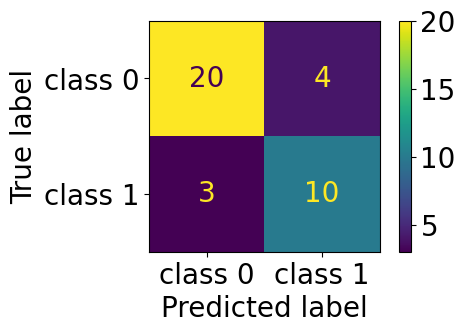

the number is  0
0.7936507936507936
Fitting 4 folds for each of 30 candidates, totalling 120 fits


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


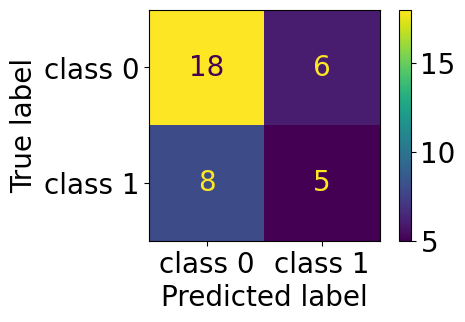

c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


the number is  1
0.3333333333333333
Fitting 4 folds for each of 30 candidates, totalling 120 fits


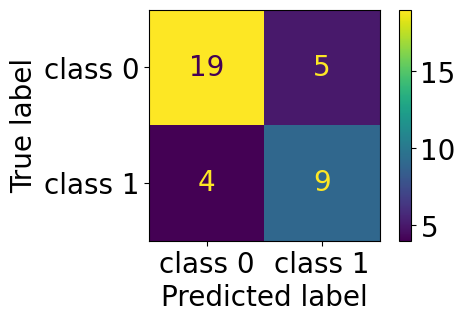

the number is  2
0.7352941176470589
Fitting 4 folds for each of 30 candidates, totalling 120 fits


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


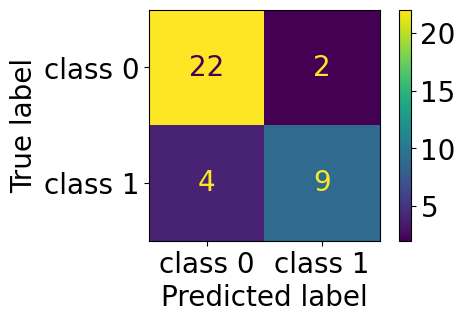

c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


the number is  3
0.703125
Fitting 4 folds for each of 30 candidates, totalling 120 fits


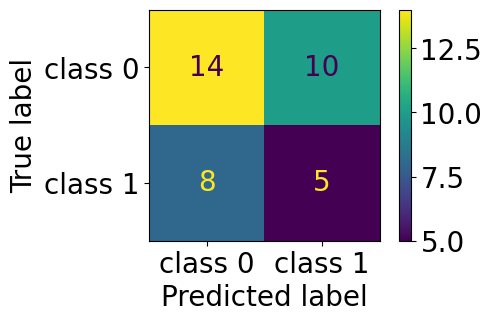

the number is  4
0.47619047619047616
Fitting 4 folds for each of 30 candidates, totalling 120 fits


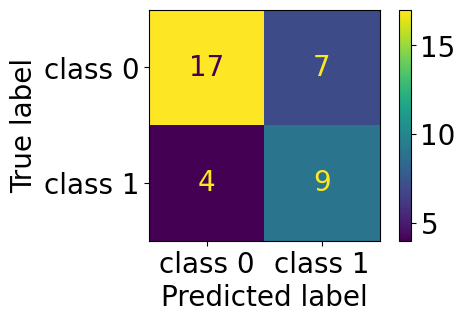

the number is  5
0.4166666666666667
Fitting 4 folds for each of 30 candidates, totalling 120 fits


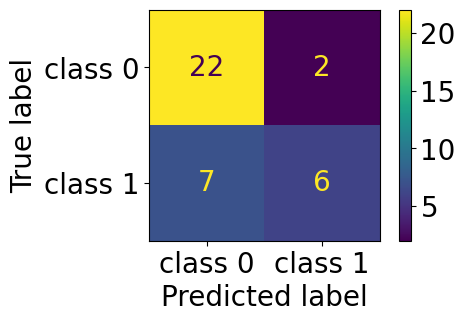

the number is  6
0.4918032786885246
Fitting 4 folds for each of 30 candidates, totalling 120 fits


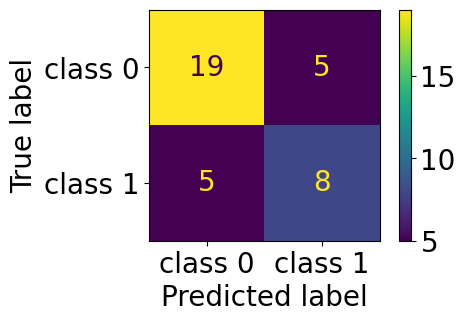

the number is  7
0.6451612903225806
Fitting 4 folds for each of 30 candidates, totalling 120 fits


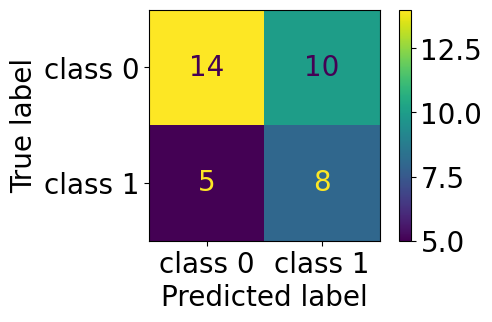

the number is  8
0.5737704918032787
Fitting 4 folds for each of 30 candidates, totalling 120 fits


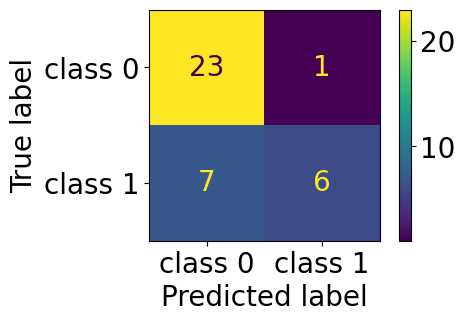

the number is  9
0.625


In [330]:
plt.rcParams.update({'font.size': 20})
for i in range(10):
    X_other_2, X_test_2, y_other_2, y_test_2 = train_test_split(X2,y2,
                        test_size = 0.2, random_state = i*42, stratify=y2)
    all_grid_LR[i].fit(X_other_2, y_other_2)
    y_pred_2 = all_grid_LR[i].predict(X_test_2)
    cm = confusion_matrix(y_test_2,y_pred_2)
    disp = ConfusionMatrixDisplay(cm,display_labels=['class 0', 'class 1'])
    fig, ax = plt.subplots(figsize=(5,3))
    disp.plot(ax=ax)
    
    plt.show()
    print('the number is ', i)
    print(all_grid_RF[i].score(X_test_2, y_test_2))

In [530]:
np.random.seed(42)

nr_runs = 10
scores = np.zeros([X2.shape[1],nr_runs])

test_score = grid_LR.score(X_test_2,y_test_2)
print('test score = ',test_score)
print('test baseline = ',np.sum(y_test_2 == 0)/len(y_test_2))
# loop through the features
for i in range(X2.shape[1]):
    print('shuffling '+str(X2.columns[i]))
    acc_scores = []
    for j in range(nr_runs):
        X_test_shuffled = X_test_2.copy()
        X_test_shuffled[X2.columns[i]] = np.random.permutation(X_test_2[X2.columns[i]].values)
        acc_scores.append(best_model_LR[2].score(X_test_shuffled,y_test_2))
    print('   shuffled test score:',np.around(np.mean(acc_scores),3),'+/-',np.around(np.std(acc_scores),3))
    scores[i] = acc_scores

ftr_names = X2.columns
sorted_indcs = np.argsort(np.mean(scores,axis=1))[::-1]
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(20,12))
plt.boxplot(scores[sorted_indcs].T,tick_labels=ftr_names[sorted_indcs],vert=False)
plt.axvline(test_score,label='test score')
plt.title("Permutation Importances (test set)")
plt.xlabel('score with perturbed feature')
plt.legend()
plt.tight_layout()
plt.show()

ValueError: columns are missing: {'time_to_aGvHD_III_IV', 'ANCrecovery', 'PLTrecovery'}

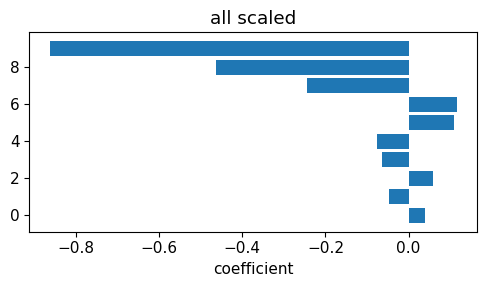

In [332]:
feature_names = list(grid_LR.best_estimator_[0].named_transformers_['onehot'][0].get_feature_names_out(onehot_ftrs)) + list(grid_LR.best_estimator_[0].named_transformers_['ord'][0].get_feature_names_out(ordinal_ftrs)) + minmax_ftrs + std_ftrs
 

coefs = grid_LR.best_estimator_[-1].coef_[0]
sorted_indcs = np.argsort(np.abs(coefs))

plt.figure(figsize=(5,3))
plt.rcParams.update({'font.size': 11})
plt.barh(np.arange(10),coefs[sorted_indcs[-10:]])
#plt.yticks(np.arange(10),feature_names[sorted_indcs[-10:]])
plt.xlabel('coefficient')
plt.title('all scaled')
plt.tight_layout()
#plt.savefig('figures/LR_coefs_scaled.png',dpi=300)
plt.show()

In [386]:
#KN
from sklearn.neighbors import KNeighborsClassifier
param_grid_KN = {'kneighborsclassifier__n_neighbors': [1,3,10,30],
              'kneighborsclassifier__weights': ['uniform','distance']}
test_score_KN = []
best_model_KN = []
all_grid_KN = []
for random_state in range(10):
    X_other_2, X_test_2, y_other_2, y_test_2 = train_test_split(X2,y2,
                        test_size = 0.2, random_state = random_state*42, stratify=y2)
    kfold = StratifiedKFold(n_splits=4, shuffle=True, random_state = random_state*42)
    
    clf_KN = make_pipeline(preprocessor, StandardScaler(), KNeighborsClassifier())
    grid_KN = GridSearchCV(clf_KN, param_grid=param_grid_KN, cv=kfold, scoring=my_f2_scorer(), return_train_score = True,n_jobs=-1,verbose=True)
    # do kfold CV on X_other
    grid_KN.fit(X_other_2, y_other_2)
    print(grid_KN.best_score_)
    test_score_KN.append(grid_KN.score(X_test_2,y_test_2))
    print(grid_KN.score(X_test_2,y_test_2))
    best_model_KN.append(grid_KN.best_estimator_)
    print(grid_KN.best_params_)
    all_grid_KN.append(grid_LR)

Fitting 4 folds for each of 8 candidates, totalling 32 fits
0.3467741935483871
0.3225806451612903
{'kneighborsclassifier__n_neighbors': 1, 'kneighborsclassifier__weights': 'uniform'}
Fitting 4 folds for each of 8 candidates, totalling 32 fits
0.44868917512360135
0.22727272727272727
{'kneighborsclassifier__n_neighbors': 1, 'kneighborsclassifier__weights': 'uniform'}
Fitting 4 folds for each of 8 candidates, totalling 32 fits


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


0.41195755139707924
0.47619047619047616
{'kneighborsclassifier__n_neighbors': 1, 'kneighborsclassifier__weights': 'uniform'}
Fitting 4 folds for each of 8 candidates, totalling 32 fits
0.39311865309295
0.423728813559322
{'kneighborsclassifier__n_neighbors': 3, 'kneighborsclassifier__weights': 'uniform'}
Fitting 4 folds for each of 8 candidates, totalling 32 fits


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\sklearn\preprocessing\_encoders.py:242: UserWarning: Found unknown categories in columns [4, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


0.4128787878787879
0.3333333333333333
{'kneighborsclassifier__n_neighbors': 1, 'kneighborsclassifier__weights': 'uniform'}
Fitting 4 folds for each of 8 candidates, totalling 32 fits
0.30894565487485315
0.3333333333333333
{'kneighborsclassifier__n_neighbors': 1, 'kneighborsclassifier__weights': 'uniform'}
Fitting 4 folds for each of 8 candidates, totalling 32 fits
0.44566007154035325
0.2459016393442623
{'kneighborsclassifier__n_neighbors': 1, 'kneighborsclassifier__weights': 'uniform'}
Fitting 4 folds for each of 8 candidates, totalling 32 fits
0.4174791776837652
0.3125
{'kneighborsclassifier__n_neighbors': 1, 'kneighborsclassifier__weights': 'uniform'}
Fitting 4 folds for each of 8 candidates, totalling 32 fits
0.3674907736468015
0.5223880597014925
{'kneighborsclassifier__n_neighbors': 1, 'kneighborsclassifier__weights': 'uniform'}
Fitting 4 folds for each of 8 candidates, totalling 32 fits
0.4718501984126984
0.2459016393442623
{'kneighborsclassifier__n_neighbors': 1, 'kneighborsclass

In [ ]:
import xgboost
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import train_test_split
import numpy as np 
from sklearn.model_selection import StratifiedKFold

param_grid = {"learning_rate": [0.01, 0.03, 0.1, 0.3],
              "n_estimators": [10000],
              "seed": [0],
              "reg_alpha": [0e0, 1e-2, 1e-1, 1e0, 1e1, 1e2],
              "reg_lambda": [0e0, 1e-2, 1e-1, 1e0, 1e1, 1e2],
              "missing": [np.nan], 
              "max_depth": [1,3,10,30,100],
              "colsample_bytree": [0.9],              
              "subsample": [0.66]}

test_score_all = []

CV_score_all = []

CV_mean_list = []

best_params_list = []
for random_state in range(10):
    X_other, X_test, y_other, y_test = train_test_split(X,y,
                        test_size = 0.2, random_state = random_state*42, stratify=y)
    kfold = StratifiedKFold(n_splits=4, shuffle=True, random_state = random_state*42)
    CV_mean = []
    CV_std = []
    for i in range(len(ParameterGrid(param_grid))):
        XGB = xgboost.XGBClassifier()
        XGB.set_params(**ParameterGrid(param_grid)[i],early_stopping_rounds=50)
        CV_score = []
        for fold_number, (X_train_index, X_CV_index) in enumerate(kfold.split(X_other, y_other)):
            X_train, y_train = X_other.iloc[X_train_index], y_other.iloc[X_train_index]
            X_CV, y_CV = X_other.iloc[X_CV_index], y_other.iloc[X_CV_index]    
            
            #preprocessing
            X_train_prep = clf.fit_transform(X_train)
            X_CV_prep = clf.transform(X_CV)
            X_test_prep = clf.transform(X_test)
            
            #XGB predicting
            XGB.fit(X_train_prep,y_train,eval_set=[(X_CV_prep, y_CV)], verbose=False)
            y_CV_pred = XGB.predict(X_CV_prep)
            i_CV_score = f2_func(y_CV,y_CV_pred)
            CV_score_all.append(i_CV_score)
            CV_score.append(i_CV_score)
        CV_mean.append(np.mean(CV_score))
        CV_std.append(np.std(CV_score))

    best_params_list.append(ParameterGrid(param_grid)[np.argmax(CV_mean)])
    CV_mean_list.append(np.mean(CV_mean))
    XGB.set_params(**ParameterGrid(param_grid)[np.argmax(CV_mean)],early_stopping_rounds=50)
    XGB.fit(X_train_prep,y_train,eval_set=[(X_CV_prep, y_CV)], verbose=False)
    y_test_pred = XGB.predict(X_test_prep)
    test_score = f2_func(y_test,y_test_pred)
    test_score_all.append(test_score)

In [276]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
import xgboost as xgb
from sklearn.pipeline import make_pipeline

ordinal_ftrs = ['CMVstatus', 'HLAmatch', 'Antigen', 'Alel', 'HLAgrI'] 
# CMVstatus: (the higher the value the lower the compatibility)
ordinal_cats = [[0,1,2,3,10], [0,1,2,3,10], [-1, 0, 1, 2, 10], [-1, 0, 1, 2, 3, 10], 
                [0,1,2,3,4,5,6,7, 10]] 

onehot_ftrs = ['Recipientgender', 'Stemcellsource', 'IIIV',
       'Gendermatch', 'DonorABO', 'RecipientABO', 'RecipientRh', 'ABOmatch',
       'DonorCMV', 'RecipientCMV', 'Disease', 'Riskgroup',
       'Txpostrelapse', 'Diseasegroup', 'HLAmismatch',
       'Relapse', 'aGvHDIIIIV', 'extcGvHD',]

minmax_ftrs = ['Donorage','Recipientage']

std_ftrs = ['CD34kgx10d6', 'CD3dCD34', 'CD3dkgx10d8', 'Rbodymass', 'ANCrecovery', 'PLTrecovery',
       'time_to_aGvHD_III_IV']

#numeric_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='mean')), 
# ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[    
    ('imputer2', SimpleImputer(strategy='constant', fill_value=-10)),    
    ('onehot', OneHotEncoder(sparse_output=False,handle_unknown='ignore', drop="first"))])
ordinal_transformer = Pipeline(steps=[
    ('imputer3', SimpleImputer(strategy='constant', fill_value=10)),
    ('ordinal', OrdinalEncoder(categories = ordinal_cats))])
# collect all the encoders
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', categorical_transformer, onehot_ftrs),
        ('ord', ordinal_transformer, ordinal_ftrs),
        ('minmax', MinMaxScaler(), minmax_ftrs),
        ('std', StandardScaler(), std_ftrs)])

#clf = Pipeline(steps=[('preprocessor', preprocessor)]) # for now we only preprocess 
                                                       # later on we will add other steps here



In [277]:
# Step 4: Train and tune an XGBoost model with GridSearchCV
# Define hyperparameter grid for tuning

#param_grid = {"learning_rate": [0.03, 0.3, 0.5],
              #"seed": [0],
              #"reg_alpha": [0, 1, 3],
              #"reg_lambda": [0, 1, 3],
              #"missing": [np.nan], 
              #"max_depth": [1,3,10,30],
              #"colsample_bytree": [0.9],              
              #"subsample": [0.66]}
param_grid = {
    'xgbclassifier__max_depth': [3, 5, 7, 9],
    'xgbclassifier__learning_rate': [0.01, 0.1, 0.3, 0.5, 0.7]
}
train_scores = []
test_scores = []
best_params_list = []
test_sets = []
best_xgb_models = []


for random_state in range(5):  # Train on 5 different random states
    
    # Train-test split: 60% train, 20% validation, 20% test
    X_other, X_test, y_other, y_test = train_test_split(X, y, test_size=0.2, random_state=42*random_state, stratify=y)
    kf = StratifiedKFold(n_splits=4, shuffle=True, random_state = random_state*53)

    xgb_model = xgb.XGBClassifier(
        objective='binary:logistic',
        eval_metric='logloss',
        n_estimators=10000,  # Early stopping will prevent overfitting
        random_state=42*random_state,
        early_stopping_rounds=10
    )
    X_other_pre = preprocessor.fit_transform(X_other)
    X_test_pre = preprocessor.transform(X_test)
    print(X_other_pre.shape)
    print(X_test_pre.shape)
    pipe = make_pipeline(preprocessor, StandardScaler(), xgb_model)
    # GridSearchCV to find the best hyperparameter
    grid_search = GridSearchCV(
        estimator=xgb_model,
        param_grid=param_grid,
        scoring='accuracy',
        cv=kf,  # 4-fold cross-validation
        n_jobs = -1,
        verbose=False
    )
    
    
    # Fit GridSearchCV
    grid_search.fit(X_other_pre, y_other, eval_set= [(X_other_pre, y_other)], verbose = False)
    print(grid_search.best_score_)
    print(grid_search.score(X_test_pre,y_test))
    test_scores.append(grid_search.score(X_test_pre,y_test))
    print(grid_search.best_params_)
    best_xgb_model = grid_search.best_estimator_
    best_xgb_models.append(best_xgb_model)
    

(149, 45)
(38, 45)


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\xgboost\core.py:158: UserWarning: [00:08:06] WARNING: D:\bld\xgboost-split_1724807710452\work\src\learner.cc:740: 
Parameters: { "xgbclassifier__learning_rate", "xgbclassifier__max_depth" } are not used.

  warnings.warn(smsg, UserWarning)


0.7718705547652916
0.7631578947368421
{'xgbclassifier__learning_rate': 0.01, 'xgbclassifier__max_depth': 3}
(149, 45)
(38, 45)


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\xgboost\core.py:158: UserWarning: [00:08:09] WARNING: D:\bld\xgboost-split_1724807710452\work\src\learner.cc:740: 
Parameters: { "xgbclassifier__learning_rate", "xgbclassifier__max_depth" } are not used.

  warnings.warn(smsg, UserWarning)


0.8451280227596017
0.631578947368421
{'xgbclassifier__learning_rate': 0.01, 'xgbclassifier__max_depth': 3}
(149, 45)
(38, 45)


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\xgboost\core.py:158: UserWarning: [00:08:12] WARNING: D:\bld\xgboost-split_1724807710452\work\src\learner.cc:740: 
Parameters: { "xgbclassifier__learning_rate", "xgbclassifier__max_depth" } are not used.

  warnings.warn(smsg, UserWarning)


0.745199146514936
0.8157894736842105
{'xgbclassifier__learning_rate': 0.01, 'xgbclassifier__max_depth': 3}
(149, 45)
(38, 45)


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\xgboost\core.py:158: UserWarning: [00:08:15] WARNING: D:\bld\xgboost-split_1724807710452\work\src\learner.cc:740: 
Parameters: { "xgbclassifier__learning_rate", "xgbclassifier__max_depth" } are not used.

  warnings.warn(smsg, UserWarning)


0.8189900426742531
0.7894736842105263
{'xgbclassifier__learning_rate': 0.01, 'xgbclassifier__max_depth': 3}
(149, 45)
(38, 45)


c:\Users\ziyan\anaconda3\envs\data1030\Lib\site-packages\xgboost\core.py:158: UserWarning: [00:08:17] WARNING: D:\bld\xgboost-split_1724807710452\work\src\learner.cc:740: 
Parameters: { "xgbclassifier__learning_rate", "xgbclassifier__max_depth" } are not used.

  warnings.warn(smsg, UserWarning)


0.7249288762446657
0.7894736842105263
{'xgbclassifier__learning_rate': 0.01, 'xgbclassifier__max_depth': 3}


In [278]:
print("Average Test Accuracy:", np.mean(test_scores))
std_test_score = np.std(test_scores)
print("std of the test accuracy", std_test_score)

Average Test Accuracy: 0.7578947368421053
std of the test accuracy 0.06531407182100452


In [279]:
import pickle

np.random.seed(42)

nr_runs = 10
scores = np.zeros([X.shape[1],nr_runs])

test_score = best_xgb_models[3].score(X_test,y_test)
print('test score = ',test_score)
print('test baseline = ',np.sum(y_test == 0)/len(y_test))
# loop through the features
for i in range(X.shape[1]):
    print('shuffling '+str(X.columns[i]))
    acc_scores = []
    for j in range(nr_runs):
        X_test_shuffled = X_test.copy()
        X_test_shuffled[X.columns[i]] = np.random.permutation(X_test[X.columns[i]].values)
        acc_scores.append(best_xgb_models[3].score(X_test_shuffled,y_test))
    print('   shuffled test score:',np.around(np.mean(acc_scores),3),'+/-',np.around(np.std(acc_scores),3))
    scores[i] = acc_scores

ValueError: DataFrame.dtypes for data must be int, float, bool or category. When categorical type is supplied, the experimental DMatrix parameter`enable_categorical` must be set to `True`.  Invalid columns:Disease: object